### Simple 2D exampling of `DDPM`

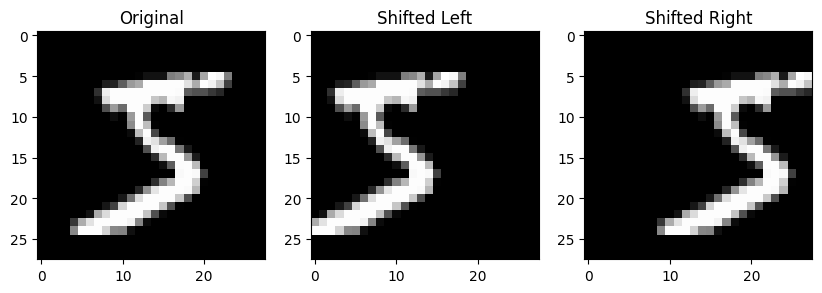

In [1]:
import torch
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor()])
train_dataset = datasets.MNIST(root='../data', train=True, download=True, transform=transform)

# Function to shift image content
def shift_image(image, direction):
    image = image.squeeze().numpy()
    shifted_image = np.zeros_like(image)
    if direction == 'left':
        shifted_image[:, :-5] = image[:, 5:]  # Shift left
        label = [1, 0]  # left = 1, right = 0
    elif direction == 'right':
        shifted_image[:, 5:] = image[:, :-5]  # Shift right
        label = [0, 1]  # left = 0, right = 1
    return torch.tensor(shifted_image, dtype=torch.float32).unsqueeze(0), torch.tensor(label, dtype=torch.float32)

# Example of how to use the function
image, original_label = train_dataset[0]
left_image, left_label = shift_image(image, 'left')
right_image, right_label = shift_image(image, 'right')

# Display the original and modified images
plt.figure(figsize=(10, 3))
plt.subplot(1, 3, 1)
plt.title('Original')
plt.imshow(image.squeeze(), cmap='gray')
plt.subplot(1, 3, 2)
plt.title('Shifted Left')
plt.imshow(left_image.squeeze(), cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Shifted Right')
plt.imshow(right_image.squeeze(), cmap='gray')
plt.show()

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch as th
import torch.nn as nn
import torch.nn.functional as F
from diffusion import (
    get_ddpm_constants,
    DiffusionUNetLegacy,
    forward_sample,
    eval_ddpm_2d,
)
from util import (
    get_torch_size_string,
    plot_ddpm_2d_result,
)
from dataset import mnist
np.set_printoptions(precision=3)
th.set_printoptions(precision=3)
plt.rc('xtick',labelsize=8)
plt.rc('ytick',labelsize=8)
%matplotlib inline
%config InlineBackend.figure_format='retina'
print ("PyTorch version:[%s]."%(th.__version__))

PyTorch version:[2.3.1+cu118].


### Initialize

In [3]:
dc = get_ddpm_constants(
    schedule_name = 'cosine', # 'linear', 'cosine'
    T             = 1000,
    np_type       = np.float32,
)
device = 'cuda' if th.cuda.is_available() else 'mps'
print ("device:[%s]"%(device))

device:[cuda]


### Training data `x_0`: [N x C x W x H]

In [4]:
# train_iter,test_iter,train_data,train_label,test_data,test_label = \
#     mnist(root_path='../data',batch_size=128)
# x_0 = train_data[:,None,:,:].to(device)/255.
# print ("MNIST ready. train_data:[%s]"%(get_torch_size_string(x_0)))

In [5]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import Dataset
import numpy as np
import matplotlib.pyplot as plt

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor()])
train_dataset = datasets.MNIST(root='../data', train=True, download=True, transform=transform)

# Function to shift image content
def shift_image(image, direction, original_label, device):
    image = image.squeeze().numpy()
    shifted_image = np.zeros_like(image)
    if direction == 'left':
        shifted_image[:, :-5] = image[:, 5:]  # Shift left
        label = [original_label+1, 0, 1, 0]  # left shift with original label
    elif direction == 'right':
        shifted_image[:, 5:] = image[:, :-5]  # Shift right
        label = [0, original_label+1, 0, 1]  # right shift with original label
    return torch.tensor(shifted_image, dtype=torch.float32).unsqueeze(0).to(device), torch.tensor(label, dtype=torch.float32).to(device)

# Dataset class for modified MNIST
class ModifiedMNISTDataset(Dataset):
    def __init__(self, original_dataset, device):
        self.original_dataset = original_dataset
        self.new_images = []
        self.new_labels = []
        self.device = device
        self._process_dataset()
    
    def _process_dataset(self):
        for image, original_label in self.original_dataset:
            left_image, left_label = shift_image(image, 'left', original_label, self.device)
            right_image, right_label = shift_image(image, 'right', original_label, self.device)
            
            self.new_images.append(left_image)
            self.new_labels.append(left_label)
            self.new_images.append(right_image)
            self.new_labels.append(right_label)
    
    def __len__(self):
        return len(self.new_images)
    
    def __getitem__(self, idx):
        return self.new_images[idx], self.new_labels[idx]

# Create the modified dataset
modified_train_dataset = ModifiedMNISTDataset(train_dataset, device)

In [6]:
# torch.save(modified_train_dataset, 'modified_mnist_dataset.pth')

In [7]:
index = 0
image, labels = modified_train_dataset[index]
label_structure = labels.tolist()  # Convert to list for readability

print(f"Label Structure: {label_structure}")
print(image)
print(labels)

Label Structure: [6.0, 0.0, 1.0, 0.0]
tensor([[[0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
          0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
          0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
         [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
          0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
          0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
         [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
          0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
          0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
         [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
          0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
          0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
         [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.

### Embeddings

In [8]:
for modified_train_data in modified_train_dataset:
    image, labels = modified_train_data
    print(labels)
    break

tensor([6., 0., 1., 0.], device='cuda:0')


In [9]:
x_0_list = []
embedding_vector_list = []
for i in range(len(modified_train_dataset)):
    image, image_labels = modified_train_dataset[i]
    x_0_list.append(image)
    embedding_vector_list.append(image_labels)

# Stack all images to form the final x_0 tensor
x_0 = torch.stack(x_0_list, dim=0)
embedding_vectors_tensor = torch.stack(embedding_vector_list, dim=0)

print(x_0.shape)
print(embedding_vectors_tensor.shape)
# print(embedding_vector_list.shape)
test_embedding_vector_5_L = torch.tensor([6,0,1,0], dtype=torch.float32).to(device)
test_embedding_vector_9_R = torch.tensor([0,10,0,1], dtype=torch.float32).to(device)
test_embedding_vector_5_L_9_R = torch.tensor([6,10,1,1], dtype=torch.float32).to(device)

torch.Size([120000, 1, 28, 28])
torch.Size([120000, 4])


### Train 

it:[      0][0.0]% loss:[0.6033]


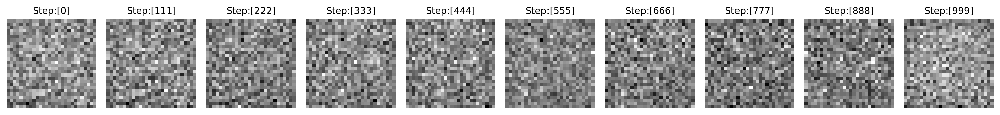

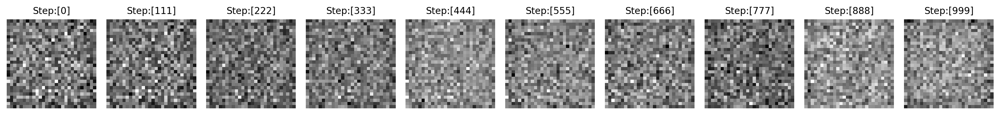

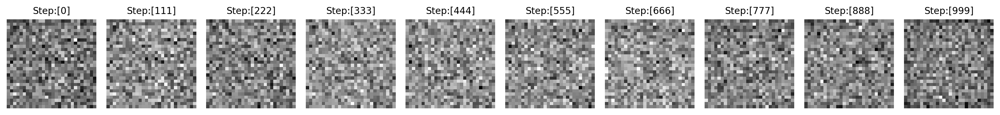

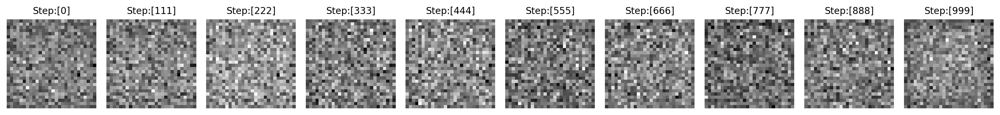

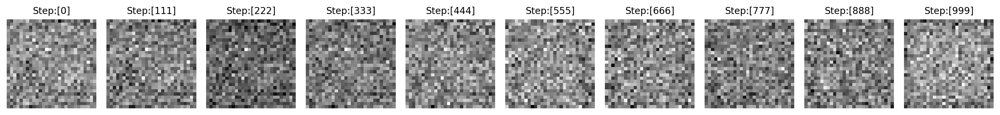

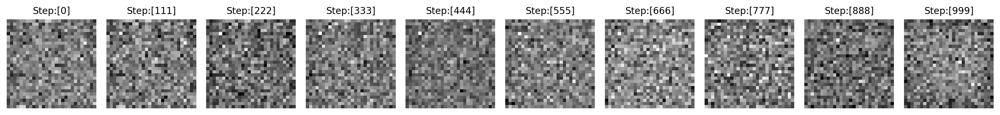

it:[   1000][10.0]% loss:[0.0972]
it:[   2000][20.0]% loss:[0.0875]


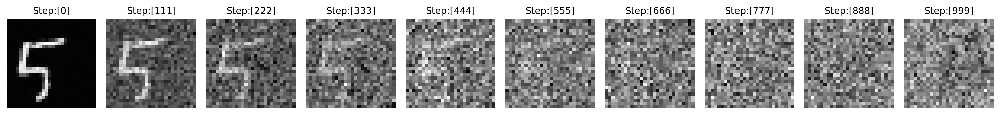

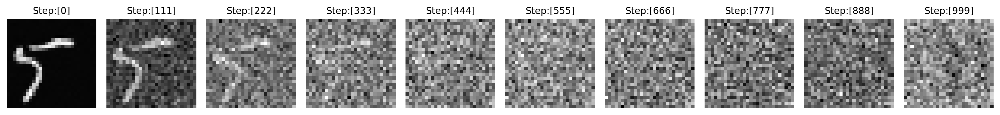

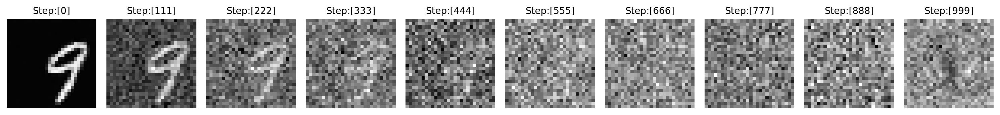

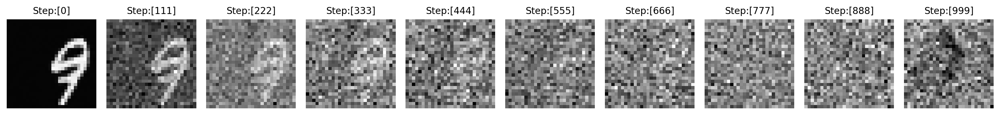

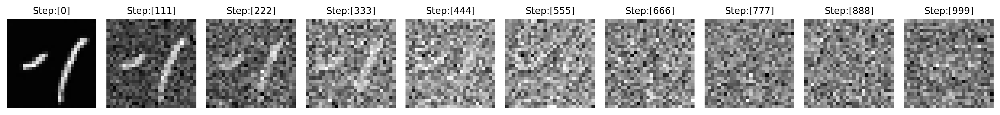

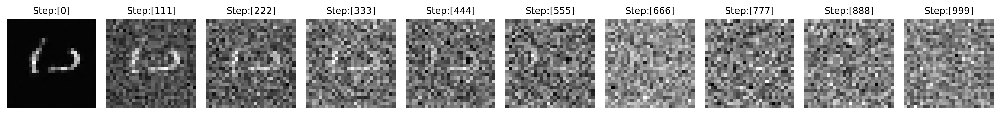

it:[   3000][30.0]% loss:[0.0736]
it:[   4000][40.0]% loss:[0.0726]


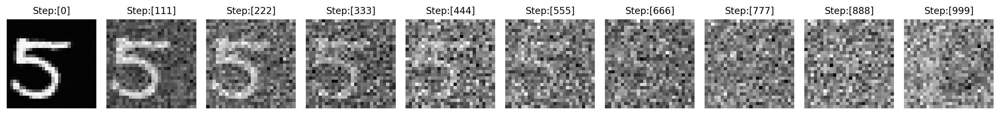

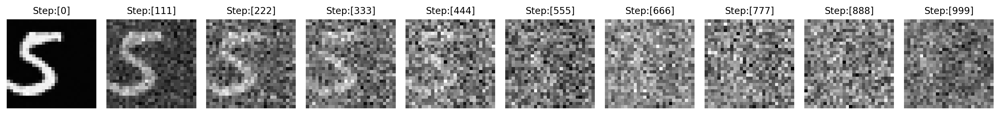

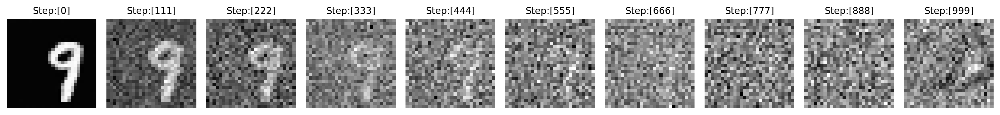

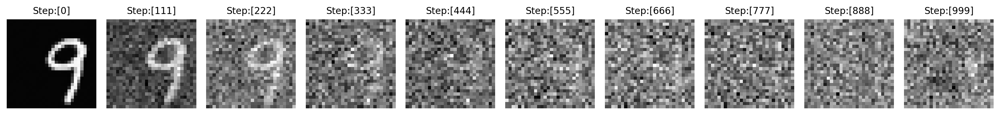

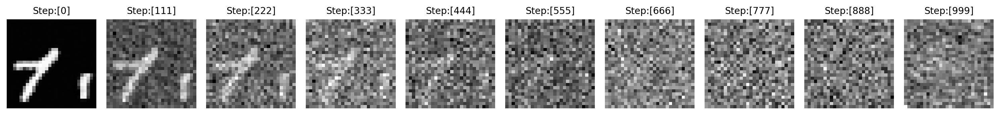

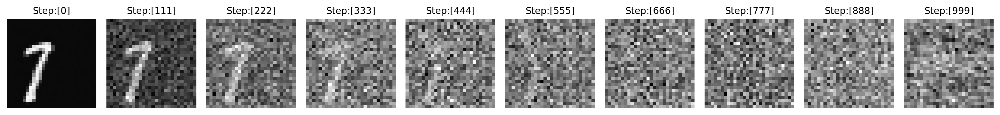

it:[   5000][50.0]% loss:[0.0808]
it:[   6000][60.0]% loss:[0.0698]


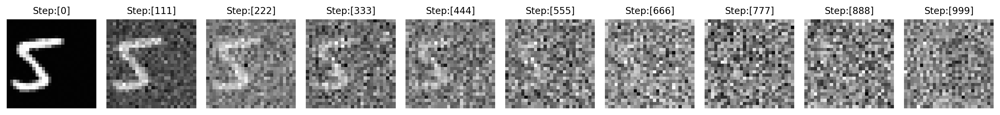

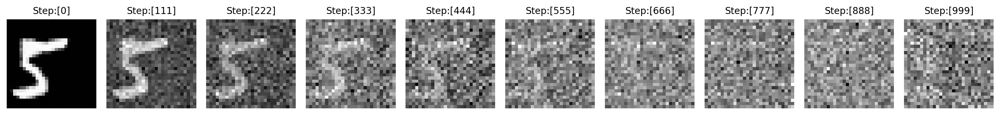

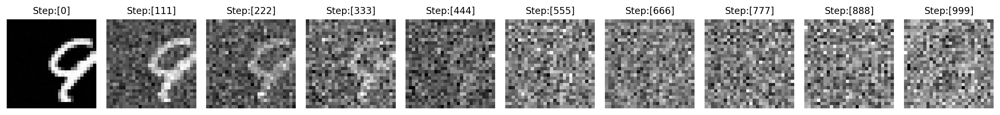

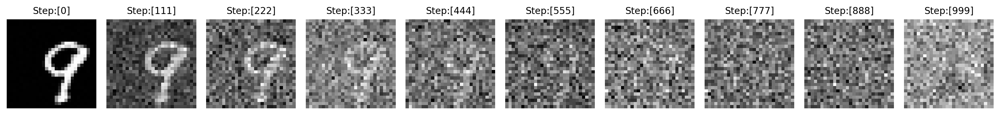

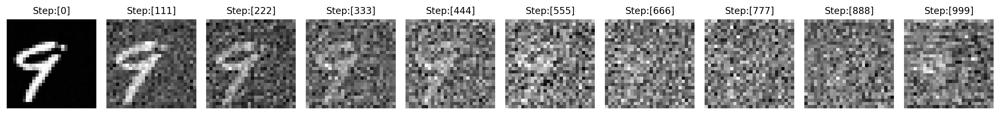

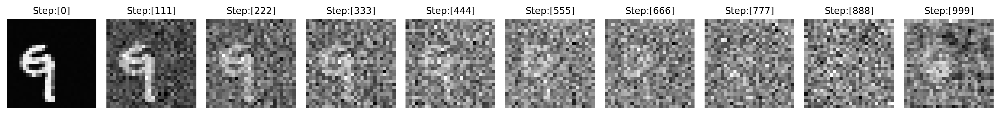

it:[   7000][70.0]% loss:[0.0668]
it:[   8000][80.0]% loss:[0.0662]


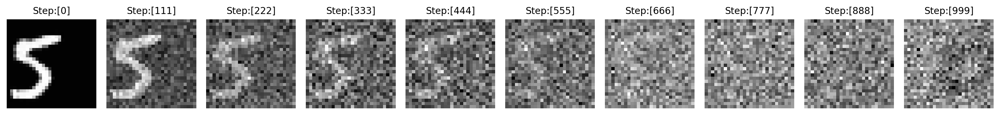

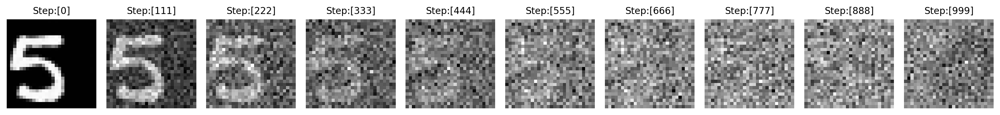

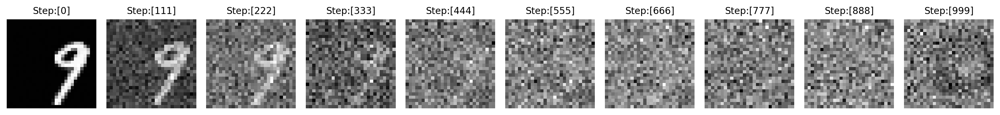

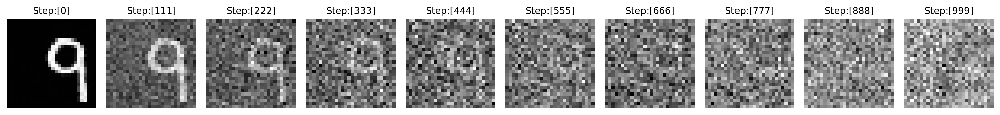

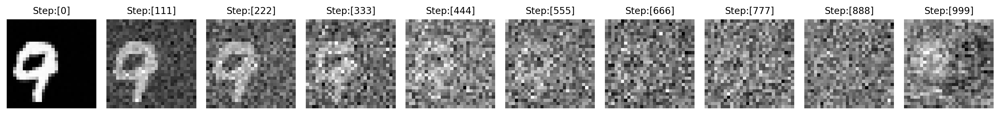

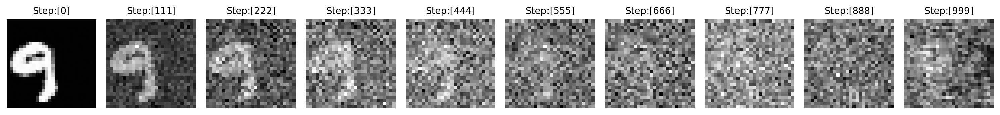

it:[   9000][90.0]% loss:[0.0746]
it:[   9999][100.0]% loss:[0.0755]


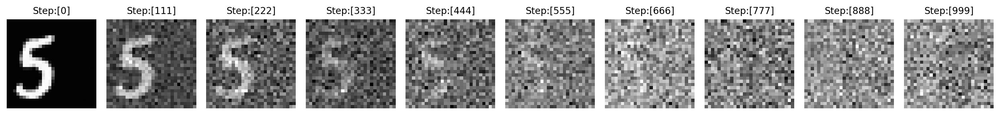

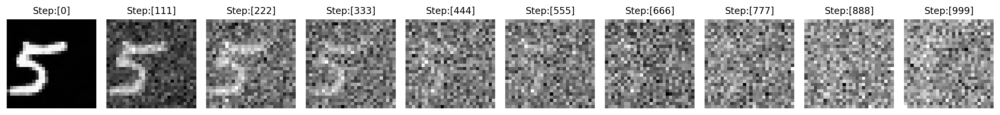

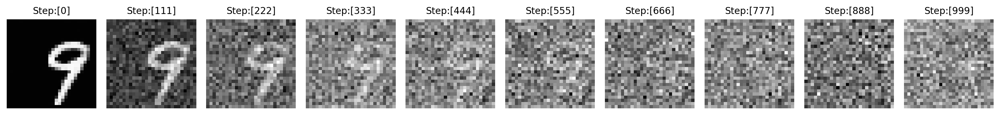

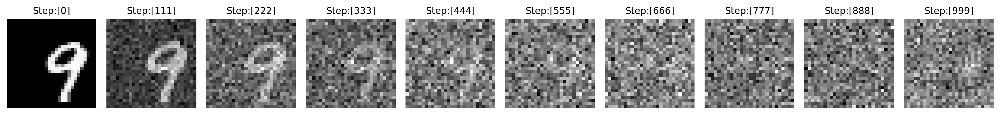

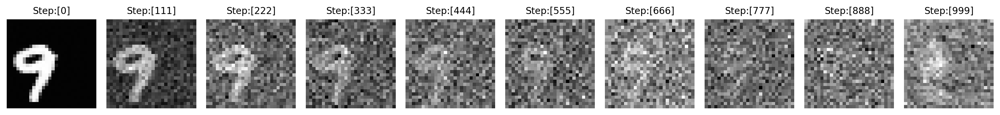

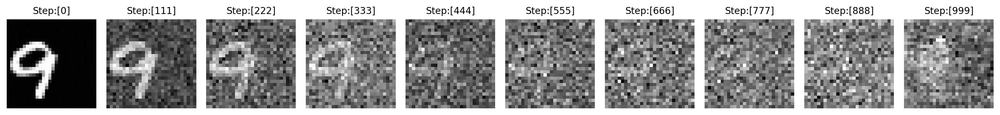

Done.


In [10]:
# Instantiate U-net
model = DiffusionUNetLegacy(
    name                 = 'unet',
    dims                 = 2,
    n_in_channels        = 1,
    n_base_channels      = 64,
    n_emb_dim            = 128,
    n_cond_dim           = 4,
    n_enc_blocks         = 4, # number of encoder blocks
    n_dec_blocks         = 4, # number of decoder blocks
    n_groups             = 16, # group norm paramter
    n_heads              = 4, # number of heads in QKV attention
    actv                 = nn.SiLU(),
    kernel_size          = 3, # kernel size (3)
    padding              = 1, # padding size (1)
    use_attention        = False, # no attention for images
    skip_connection      = True, # additional skip connection
    chnnel_multiples     = (1,2,4,8),
    updown_rates         = (1,2,1,2),
    use_scale_shift_norm = True,
    device               = device,
) # input:[B x C x W x H] => output:[B x C x W x H]

# Configuration
max_iter    = int(1e4)
batch_size  = 128
print_every = 1e3
eval_every  = 2e3

# Loop
model.train()
optm = th.optim.AdamW(params=model.parameters(),lr=1e-4,weight_decay=0.0)
schd = th.optim.lr_scheduler.ExponentialLR(optimizer=optm,gamma=0.99998)
for it in range(max_iter):
    # Zero gradient
    optm.zero_grad()
    # Get batch
    idx = np.random.choice(x_0.shape[0],batch_size)
    x_0_batch = x_0[idx,:,:,:] # [B x C x W x H]
    # Sample time steps
    step_batch = th.randint(0, dc['T'],(batch_size,),device=device).to(th.int64) # [B]
    # Forward diffusion sampling
    x_t_batch,noise = forward_sample(x_0_batch,step_batch,dc) # [B x C x W x H]
    # Noise prediction
    paritial_embeddings = torch.index_select(embedding_vectors_tensor, dim=0, index=torch.tensor(idx, device=device))
    noise_pred,_ = model(x_t_batch,step_batch,paritial_embeddings) # [B x C x W x H]
    # Compute error
    loss = F.mse_loss(noise,noise_pred)+F.smooth_l1_loss(noise,noise_pred,beta=0.1)
    # Update
    loss.backward(retain_graph=True)
    optm.step()
    schd.step()
    # Print
    if (it%print_every) == 0 or it == (max_iter-1):
        print ("it:[%7d][%.1f]%% loss:[%.4f]"%(it,100*it/max_iter,loss.item()))
    # Evaluate
    if (it%eval_every) == 0 or it == (max_iter-1):
        n_sample = 20
        step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
        x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector_5_L)
        plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)
        
        x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector_9_R)
        plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)
        
        x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector_5_L_9_R)
        plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)

print ("Done.")

In [11]:
def get_conditioning_embedding_managing(labels, device):
    torch_labels = torch.tensor(labels, dtype=torch.long).to(device)
    
    print(torch_labels)
    number_embedding_L = number_embedding(torch_labels[0])
    number_embedding_R = number_embedding(torch_labels[1])
    position_embedding_L = position_embedding(torch_labels[2])
    position_embedding_R = position_embedding(torch_labels[3])

    # 두 임베딩 벡터를 결합
    conditioning_embedding = torch.cat([number_embedding_L, number_embedding_R, position_embedding_L, position_embedding_R], dim=-1)
    
    return conditioning_embedding

print(get_conditioning_embedding_managing([6,0,1,0],device))
print(test_embedding_vector)

tensor([6, 0, 1, 0], device='cuda:0')


NameError: name 'number_embedding' is not defined

random_int :  6   8
print right
tensor([0, 8, 0, 1], device='cuda:0')


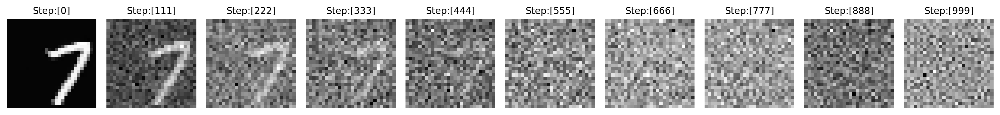

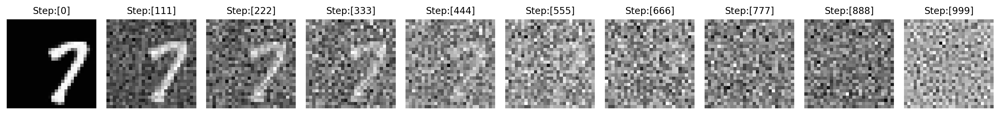

print left
tensor([6, 0, 1, 0], device='cuda:0')


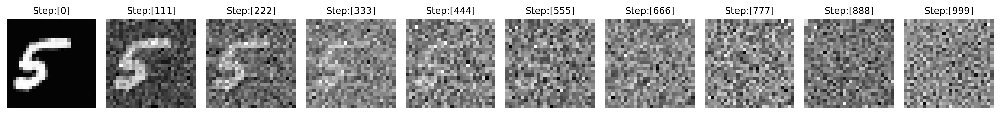

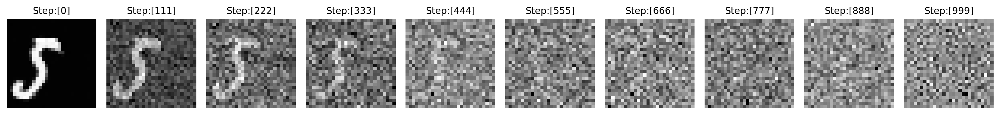

print both
tensor([6, 8, 1, 1], device='cuda:0')


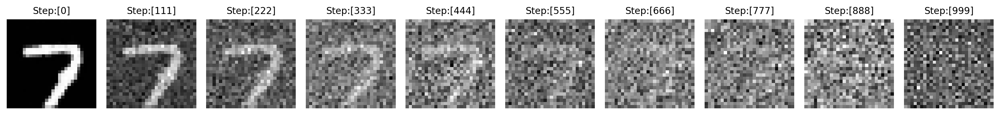

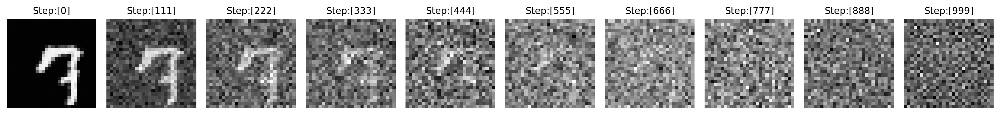

random_int :  9   7
print right
tensor([0, 7, 0, 1], device='cuda:0')


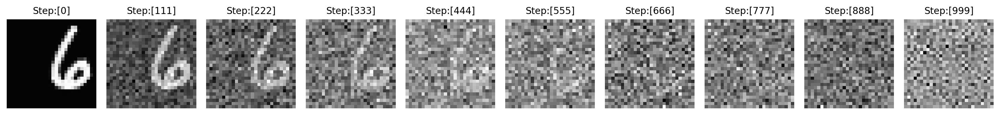

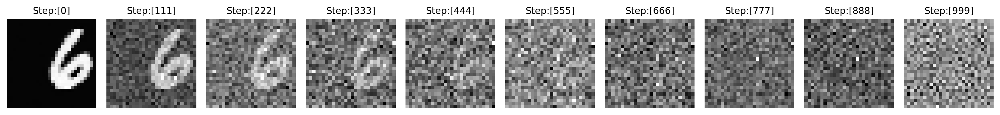

print left
tensor([9, 0, 1, 0], device='cuda:0')


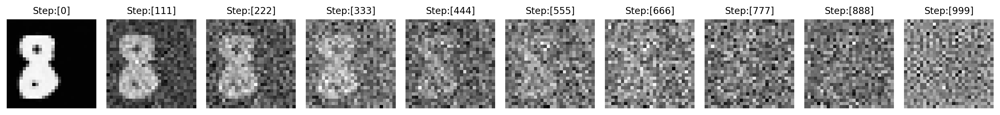

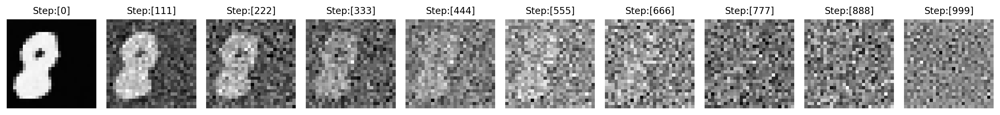

print both
tensor([9, 7, 1, 1], device='cuda:0')


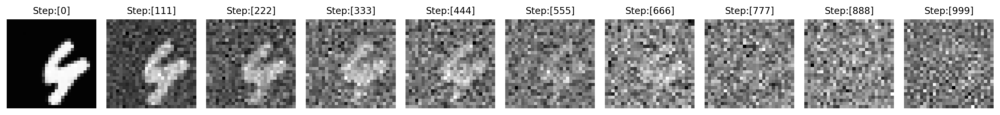

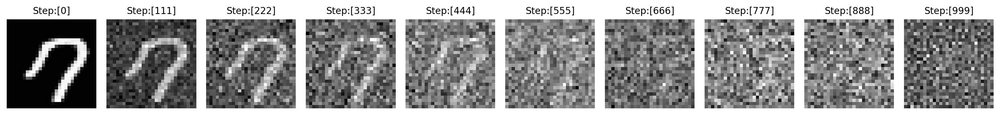

random_int :  6   7
print right
tensor([0, 7, 0, 1], device='cuda:0')


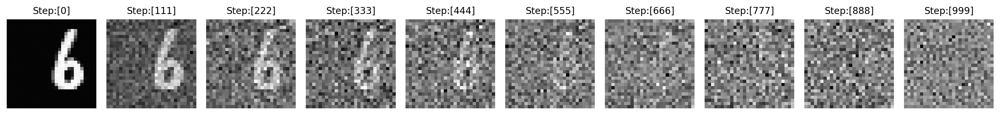

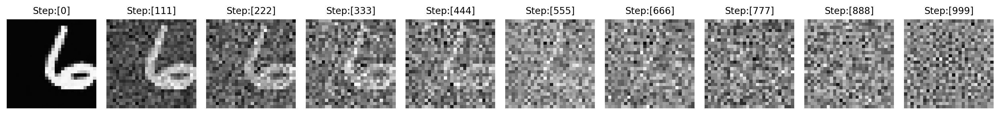

print left
tensor([6, 0, 1, 0], device='cuda:0')


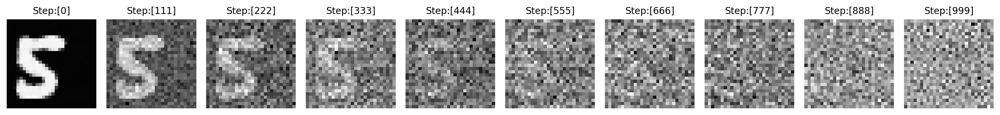

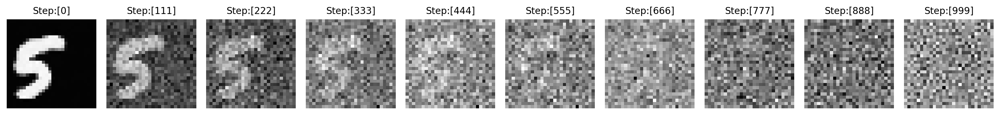

print both
tensor([6, 7, 1, 1], device='cuda:0')


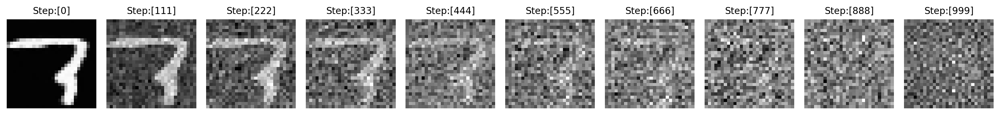

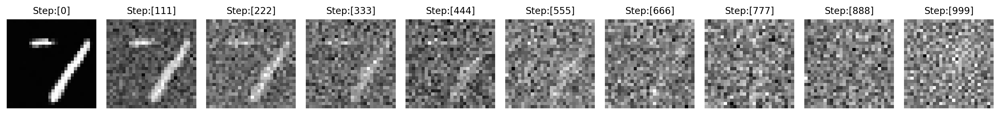

random_int :  9   5
print right
tensor([0, 5, 0, 1], device='cuda:0')


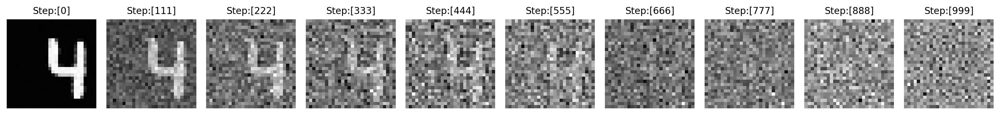

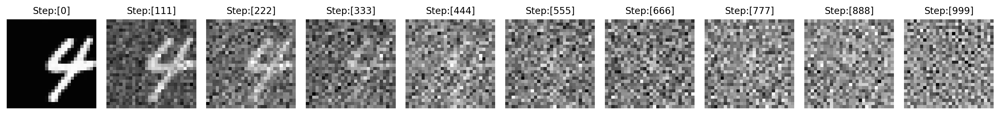

print left
tensor([9, 0, 1, 0], device='cuda:0')


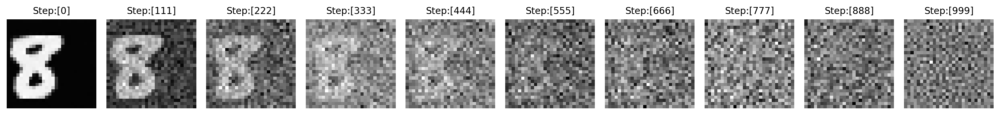

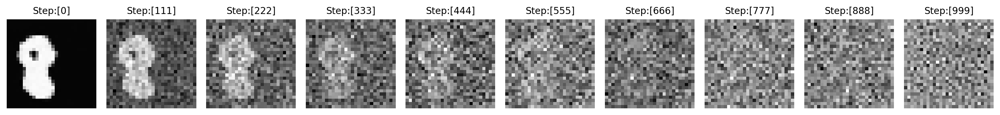

print both
tensor([9, 5, 1, 1], device='cuda:0')


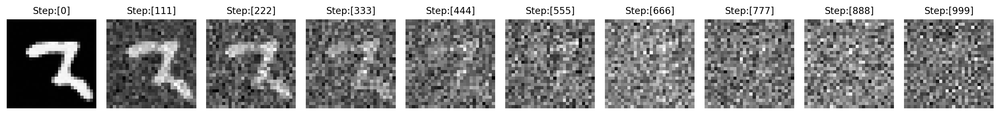

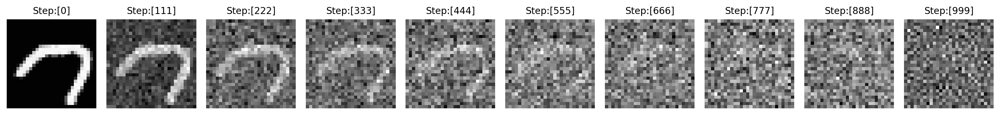

random_int :  8   1
print right
tensor([0, 1, 0, 1], device='cuda:0')


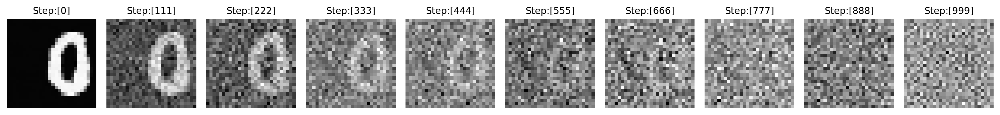

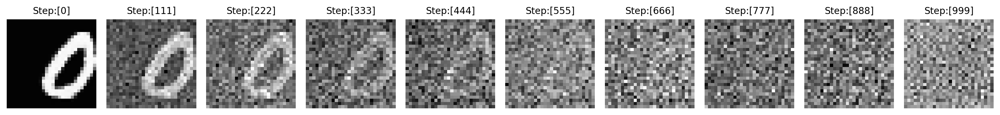

print left
tensor([8, 0, 1, 0], device='cuda:0')


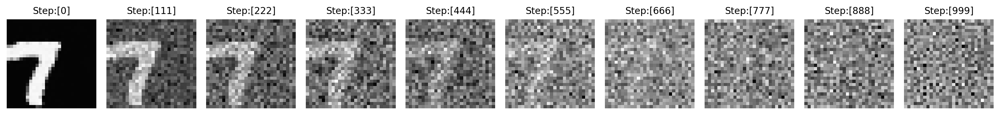

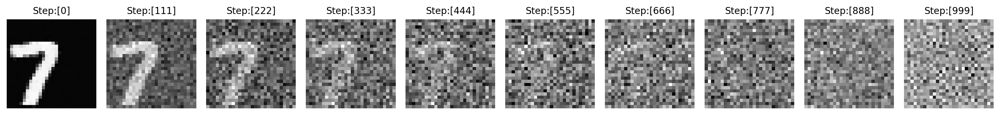

print both
tensor([8, 1, 1, 1], device='cuda:0')


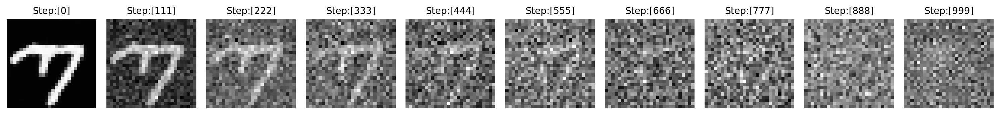

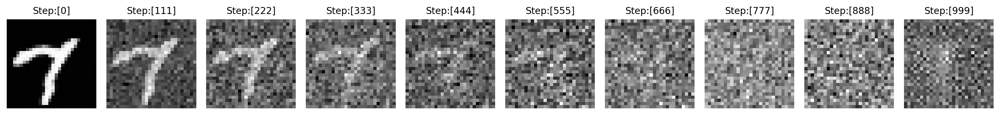

random_int :  8   7
print right
tensor([0, 7, 0, 1], device='cuda:0')


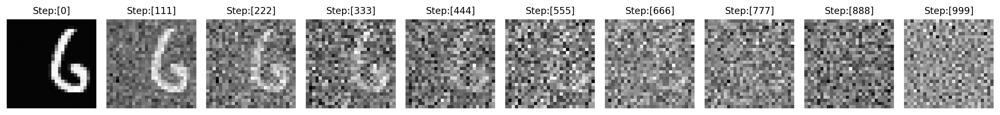

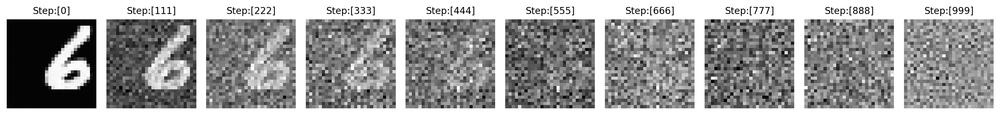

print left
tensor([8, 0, 1, 0], device='cuda:0')


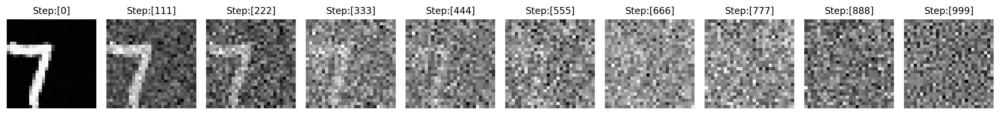

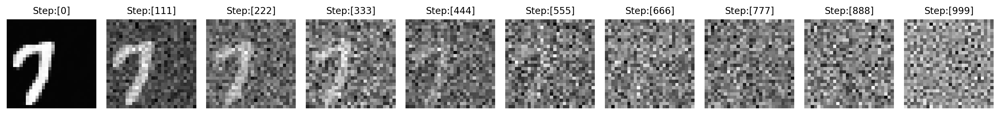

print both
tensor([8, 7, 1, 1], device='cuda:0')


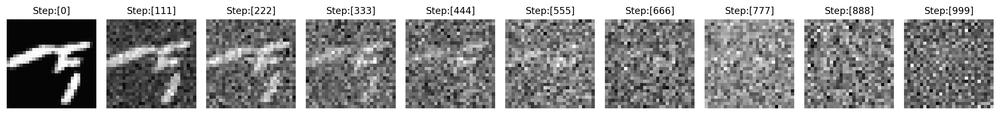

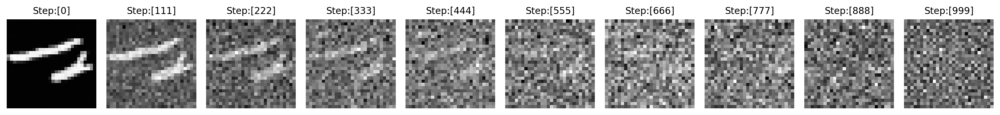

random_int :  5   5
print right
tensor([0, 5, 0, 1], device='cuda:0')


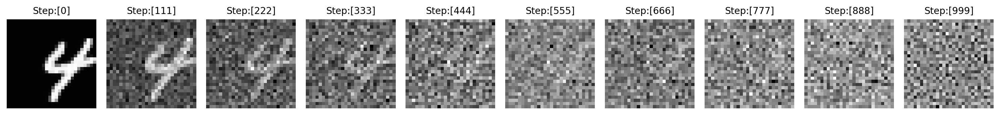

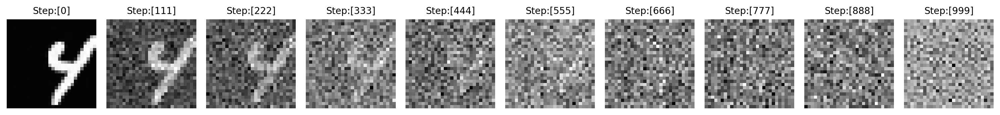

print left
tensor([5, 0, 1, 0], device='cuda:0')


KeyboardInterrupt: 

In [ ]:
# get_conditioning_embedding_managing([6,0,1,0],device)

import random
max_sampling_num = 10
for idx in range(max_sampling_num):
    random_int1 = random.randint(1, 10)
    random_int2 = random.randint(1, 10)
    print("random_int : ", random_int1, " ", random_int2)


    print("print right")
    right_sample_label = [0,random_int2,0,1]
    right_sampling_embedding_vector = get_conditioning_embedding_managing(right_sample_label,device)

    n_sample = 20
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,right_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)

    print("print left")
    left_sample_label = [random_int1,0,1,0]
    left_sampling_embedding_vector = get_conditioning_embedding_managing(left_sample_label,device)

    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,left_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)


    print("print both")
    both_sample_label = [random_int1,random_int2,1,1]
    both_sampling_embedding_vector = get_conditioning_embedding_managing(both_sample_label,device)

    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,both_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)


random_int :  7   8
print none -positional none
tensor([8, 9, 0, 0], device='cuda:0')


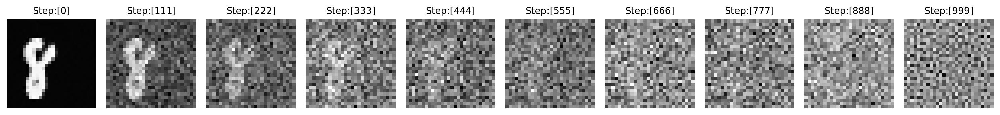

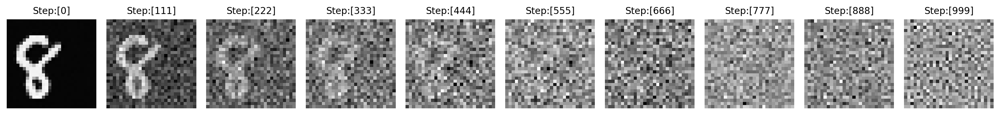

print none -positional none,left number
tensor([8, 0, 0, 0], device='cuda:0')


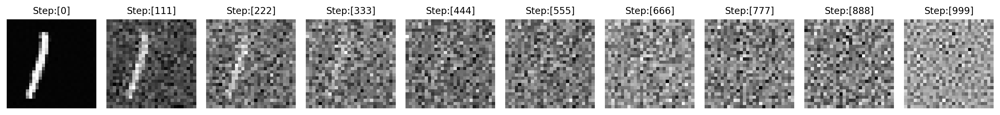

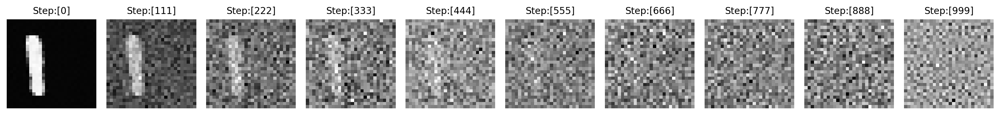

print none -positional none,right number
tensor([0, 9, 0, 0], device='cuda:0')


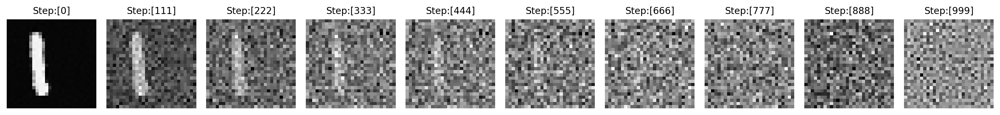

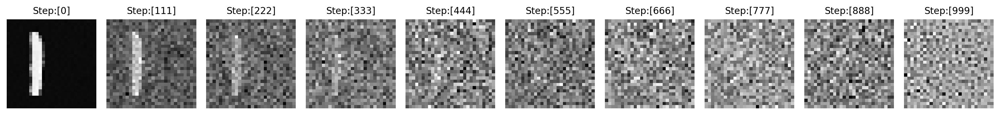

print none -number none
tensor([0, 0, 1, 1], device='cuda:0')


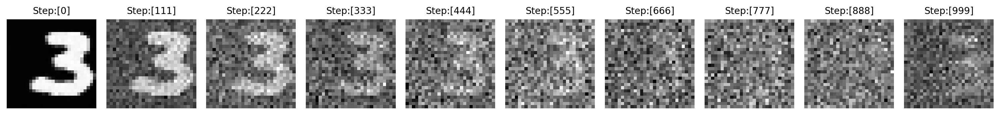

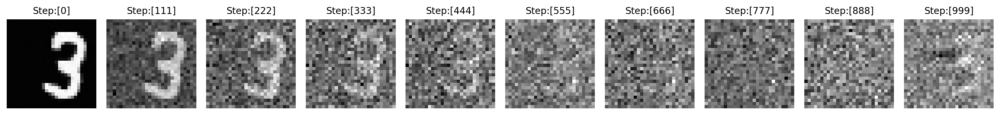

print none -number none
tensor([0, 0, 0, 1], device='cuda:0')


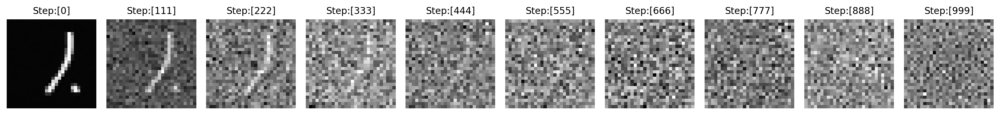

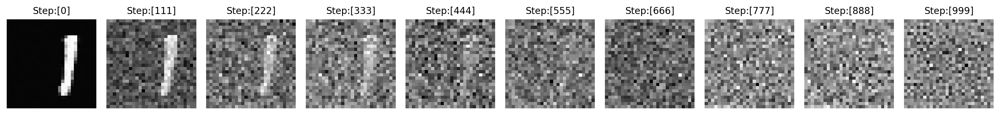

print none -number none
tensor([0, 0, 1, 0], device='cuda:0')


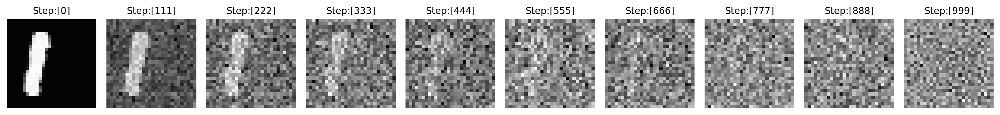

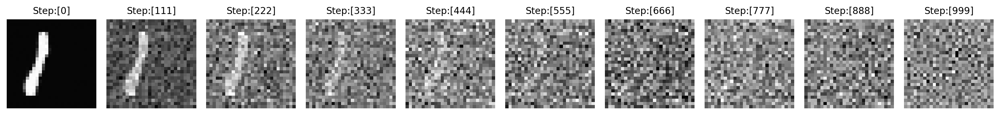

print none - all none
tensor([0, 0, 0, 0], device='cuda:0')


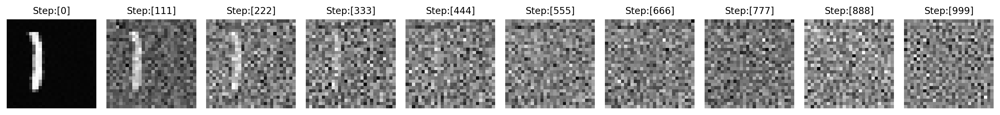

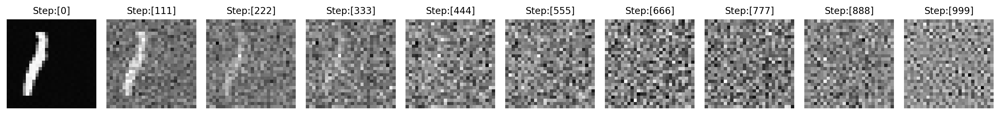

random_int :  1   3
print none -positional none
tensor([2, 4, 0, 0], device='cuda:0')


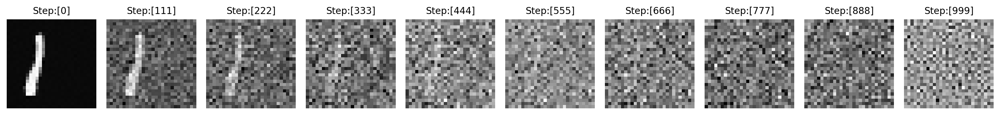

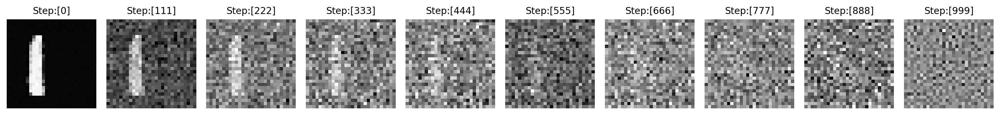

print none -positional none,left number
tensor([2, 0, 0, 0], device='cuda:0')


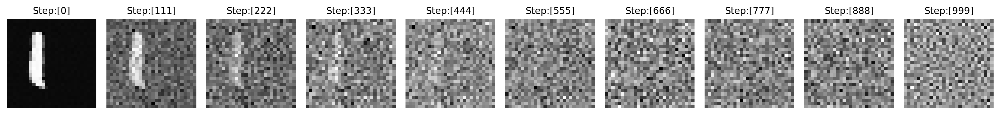

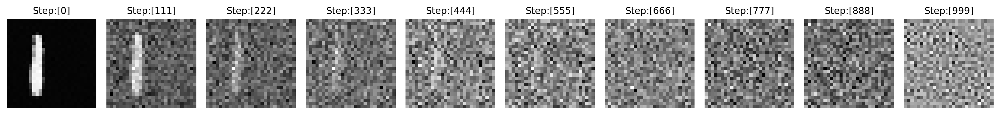

print none -positional none,right number
tensor([0, 4, 0, 0], device='cuda:0')


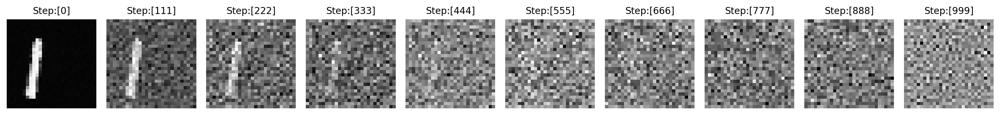

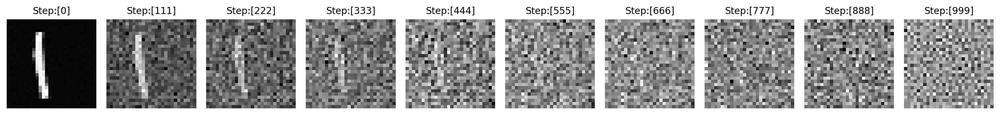

print none -number none
tensor([0, 0, 1, 1], device='cuda:0')


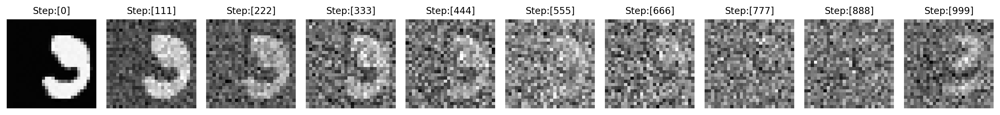

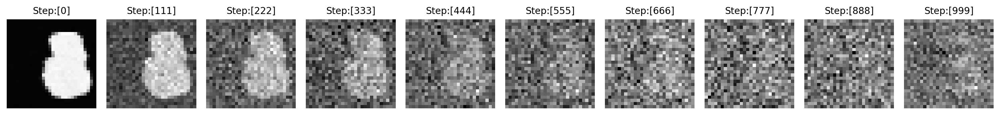

print none -number none
tensor([0, 0, 0, 1], device='cuda:0')


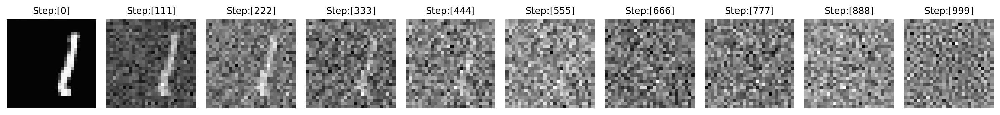

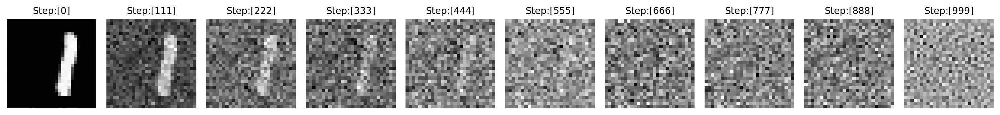

print none -number none
tensor([0, 0, 1, 0], device='cuda:0')


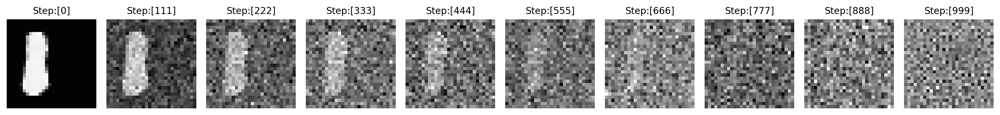

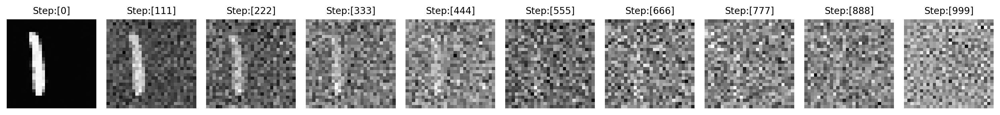

print none - all none
tensor([0, 0, 0, 0], device='cuda:0')


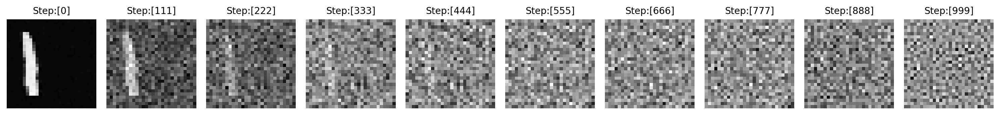

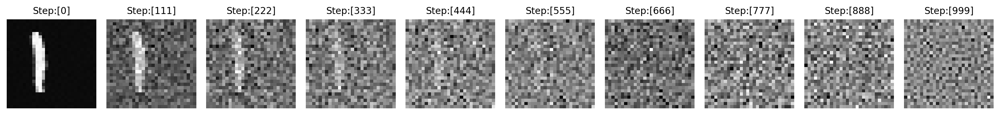

In [ ]:
# get_conditioning_embedding_managing([6,0,1,0],device)

import random
max_sampling_num = 2
for idx in range(max_sampling_num):
    random_int1 = random.randint(1, 10)
    random_int2 = random.randint(1, 10)
    print("random_int : ", random_int1 -1, " ", random_int2-1)


    print("print none -positional none")
    none_sample_label = [random_int1,random_int2,0,0]
    none_sampling_embedding_vector = get_conditioning_embedding_managing(none_sample_label,device)

    n_sample = 20
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,none_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)


    print("print none -positional none,left number")
    none_sample_label = [random_int1,0,0,0]
    none_sampling_embedding_vector = get_conditioning_embedding_managing(none_sample_label,device)

    n_sample = 20
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,none_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)


    print("print none -positional none,right number")
    none_sample_label = [0,random_int2,0,0]
    none_sampling_embedding_vector = get_conditioning_embedding_managing(none_sample_label,device)

    n_sample = 20
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,none_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)

    print("print none -number none")
    number_none_sample_label = [0,0,1,1]
    number_none_sampling_embedding_vector = get_conditioning_embedding_managing(number_none_sample_label,device)

    n_sample = 20
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,number_none_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)

    print("print none -number none")
    number_none_sample_label = [0,0,0,1]
    number_none_sampling_embedding_vector = get_conditioning_embedding_managing(number_none_sample_label,device)

    n_sample = 20
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,number_none_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)

    print("print none -number none")
    number_none_sample_label = [0,0,1,0]
    number_none_sampling_embedding_vector = get_conditioning_embedding_managing(number_none_sample_label,device)

    n_sample = 20
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,number_none_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)


    print("print none - all none")
    number_none_sample_label = [0,0,0,0]
    number_none_sampling_embedding_vector = get_conditioning_embedding_managing(number_none_sample_label,device)

    n_sample = 20
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,number_none_sampling_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)

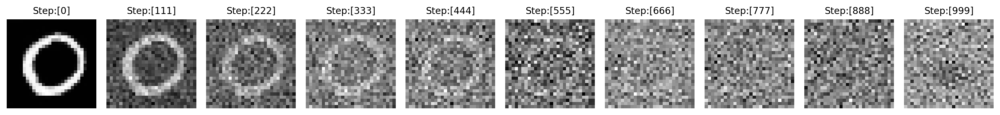

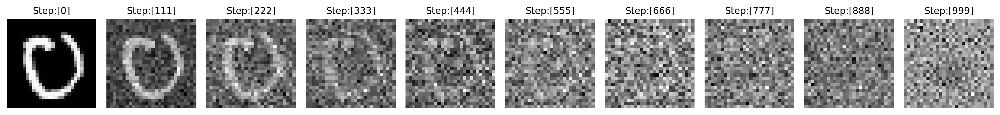

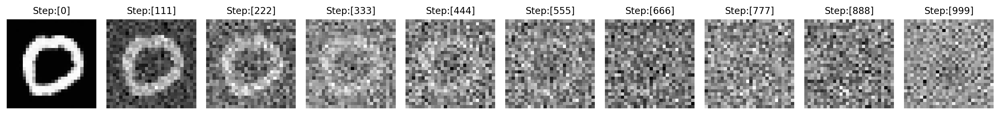

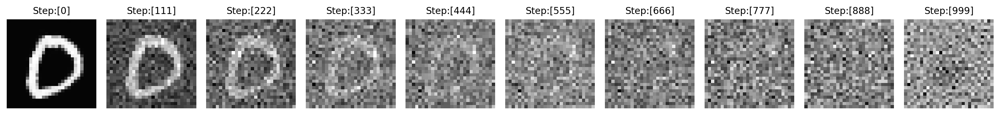

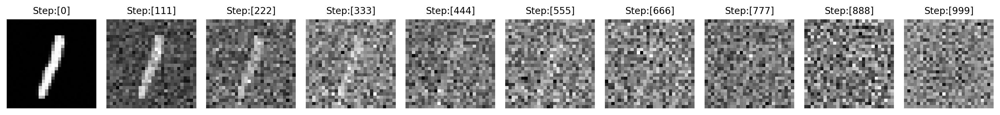

...

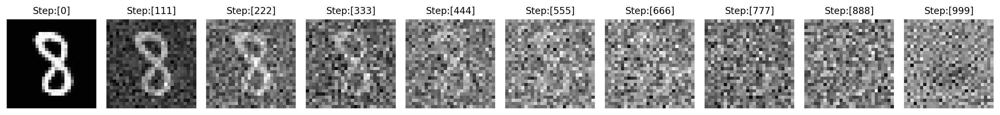

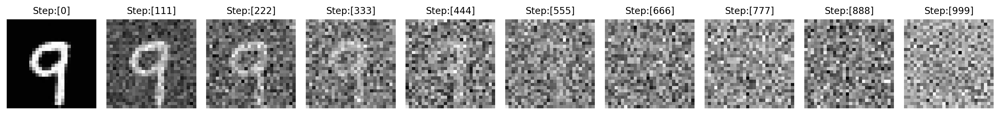

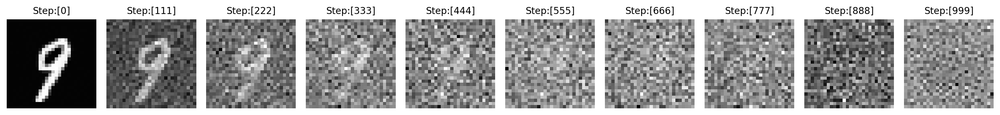

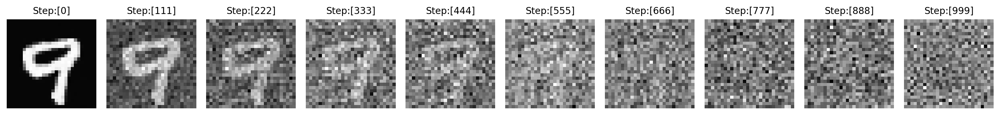

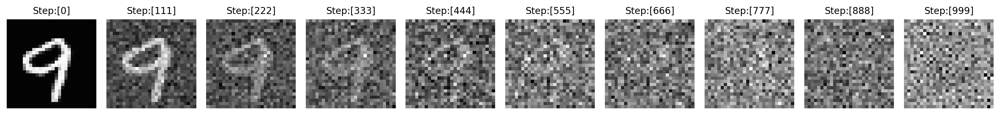

In [ ]:
# n_sample = 10
# step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
# x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector)
# plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=n_sample)


n_sample = 4
for number in range(0,10):
    test_embedding_vector = get_conditioning_embedding(number,device)
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=n_sample)

In [ ]:
import torch
from datetime import datetime

# 현재 날짜와 시간 가져오기
now = datetime.now()

# "YYYYMMDD_HHMMSS" 형식으로 포맷팅
formatted_now = now.strftime("%Y%m%d_%H%M%S")

# 모델과 옵티마이저 상태를 저장할 경로
save_path = f'result/MNIST_conditioning_position_number_simple_{formatted_now}.pth'

# 모델 및 옵티마이저 상태를 딕셔너리로 저장
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optm.state_dict(),
    'scheduler_state_dict': schd.state_dict(),
    'epoch': it,
    'loss': loss.item()
}, save_path)

print(f'Model saved to {save_path}')

Model saved to result/MNIST_conditioning_position_number_20240617_133936.pth


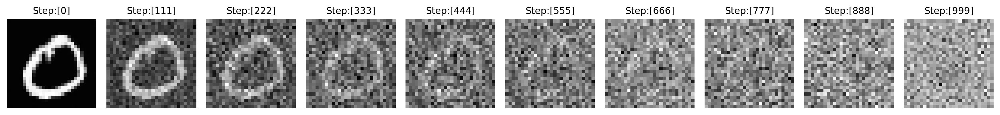

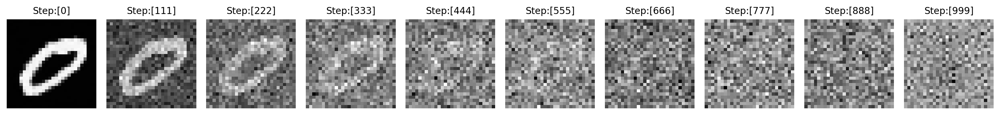

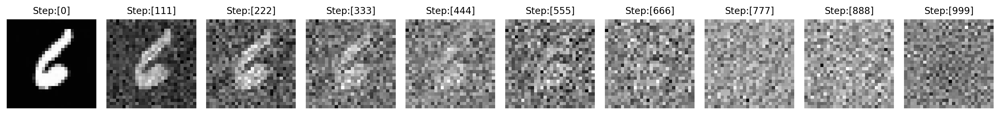

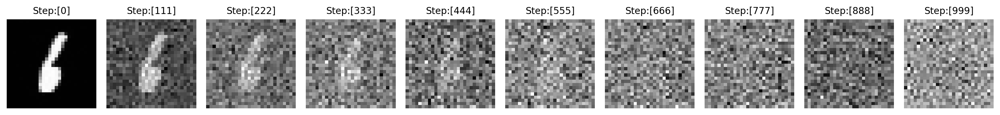

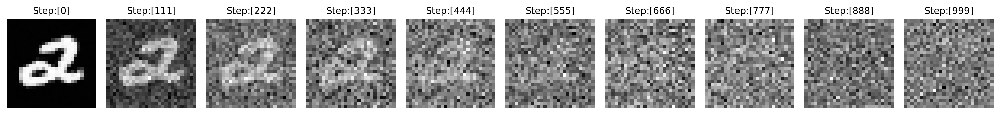

...

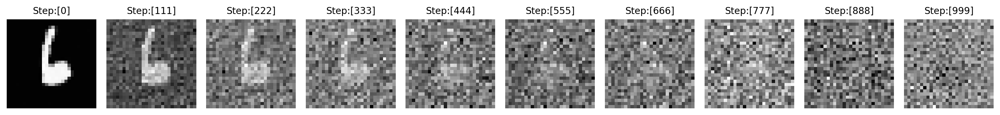

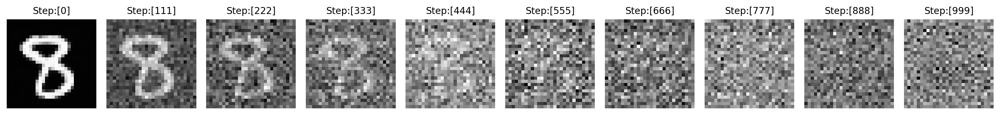

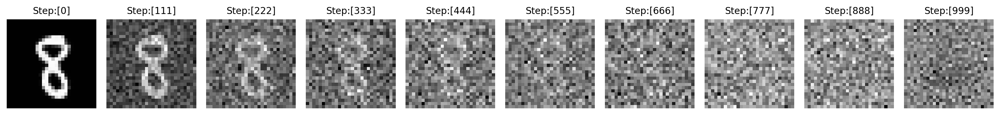

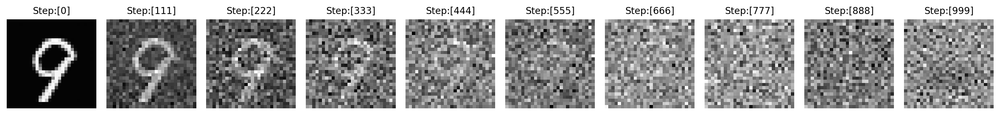

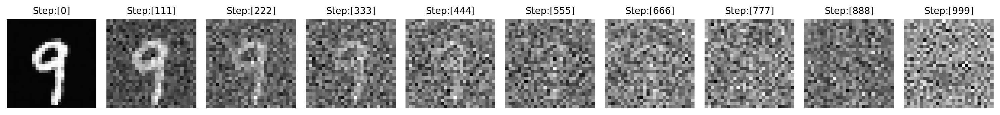

In [ ]:
def get_conditioning_embedding_circle_number(circle, number, device):
    circle_label = circle
    # 레이블을 텐서로 변환
    circle_label = torch.tensor(circle_label, dtype=torch.long).to(device)
    number_label = torch.tensor(number, dtype=torch.long).to(device)
    # 임베딩 벡터 생성
    circle_embed = circle_embedding(circle_label)
    number_embed = number_embedding(number_label)


    # 두 임베딩 벡터를 결합
    conditioning_embedding = torch.cat([circle_embed, number_embed], dim=-1)
    
    return conditioning_embedding

n_sample = 2
for number in range(0,10):
    test_embedding_vector = get_conditioning_embedding_circle_number(1,number,device)
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=n_sample)

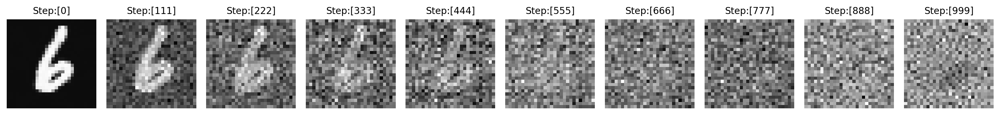

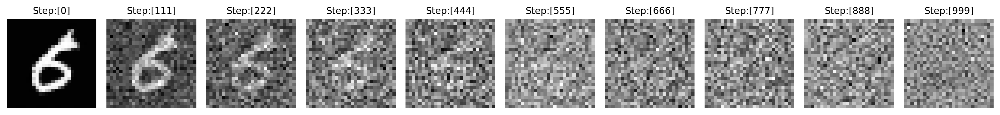

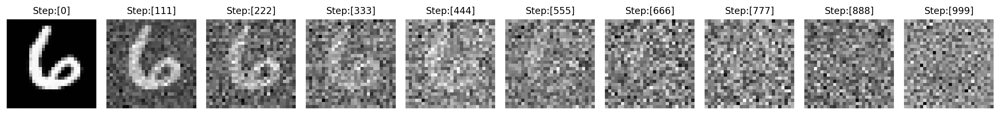

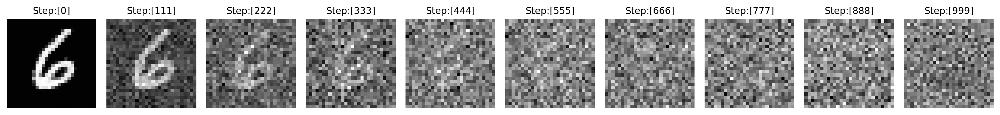

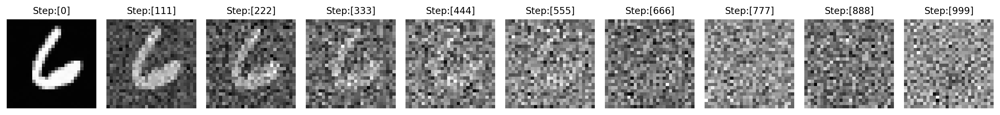

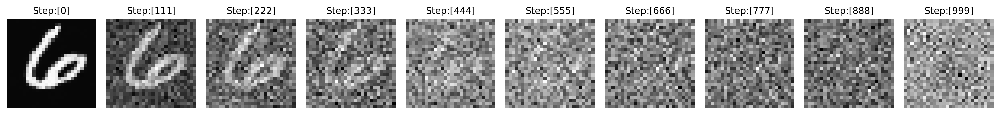

In [ ]:
def get_conditioning_embedding_circle_number(circle, number, device):
    circle_label = circle
    # 레이블을 텐서로 변환
    circle_label = torch.tensor(circle_label, dtype=torch.long).to(device)
    number_label = torch.tensor(number, dtype=torch.long).to(device)
    # 임베딩 벡터 생성
    circle_embed = circle_embedding(circle_label)
    number_embed = number_embedding(number_label)


    # 두 임베딩 벡터를 결합
    conditioning_embedding = torch.cat([circle_embed, number_embed], dim=-1)
    
    return conditioning_embedding

n_sample = 6
test_embedding_vector = get_conditioning_embedding_circle_number(1,7,device)
step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector)
plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=n_sample)

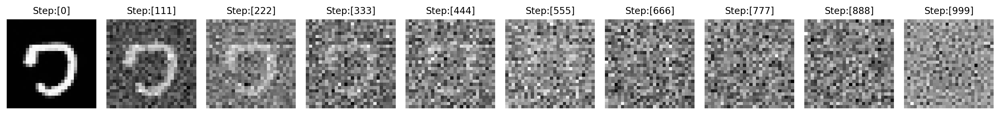

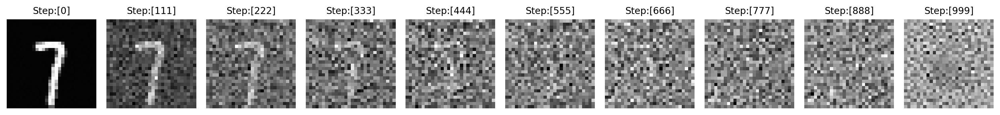

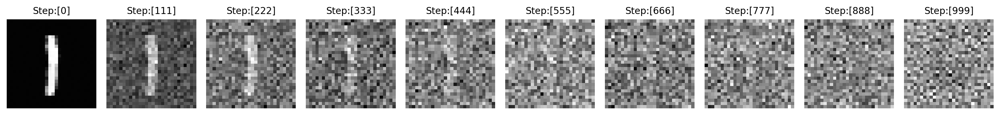

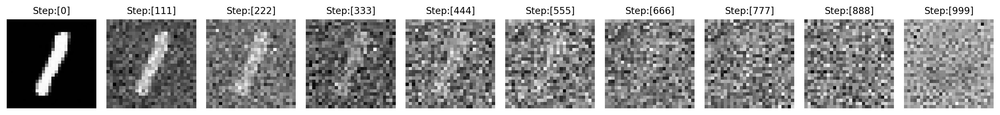

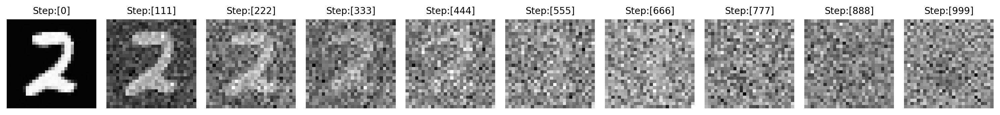

...

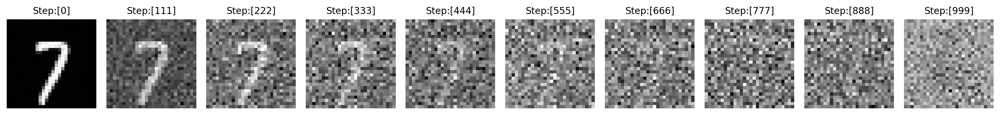

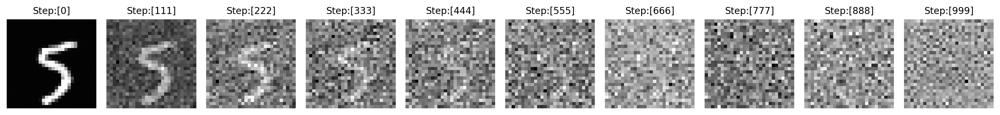

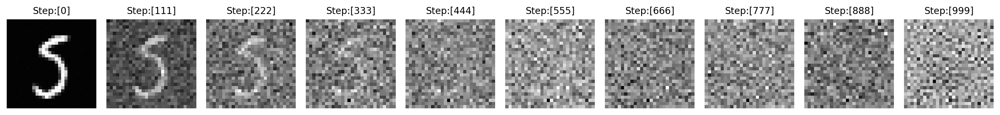

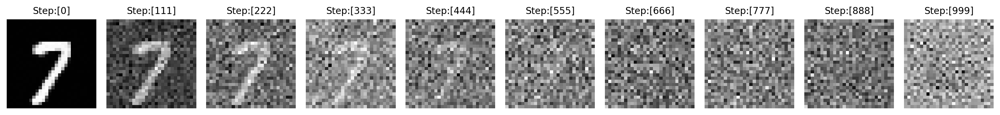

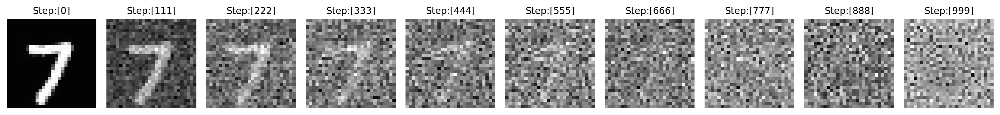

In [ ]:
def get_conditioning_embedding_circle_number(circle, number, device):
    circle_label = circle
    # 레이블을 텐서로 변환
    circle_label = torch.tensor(circle_label, dtype=torch.long).to(device)
    number_label = torch.tensor(number, dtype=torch.long).to(device)
    # 임베딩 벡터 생성
    circle_embed = circle_embedding(circle_label)
    number_embed = number_embedding(number_label)


    # 두 임베딩 벡터를 결합
    conditioning_embedding = torch.cat([circle_embed, number_embed], dim=-1)
    
    return conditioning_embedding

n_sample = 2
for number in range(0,10):
    test_embedding_vector = get_conditioning_embedding_circle_number(0,number,device)
    step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
    x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector)
    plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=n_sample)

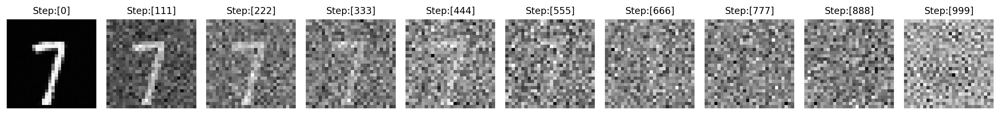

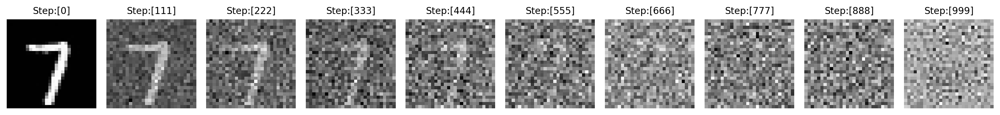

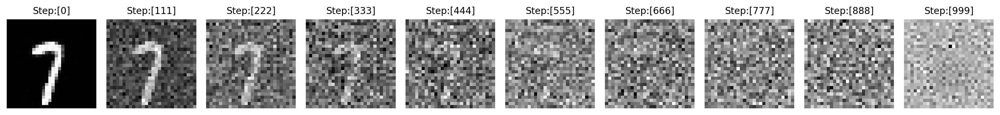

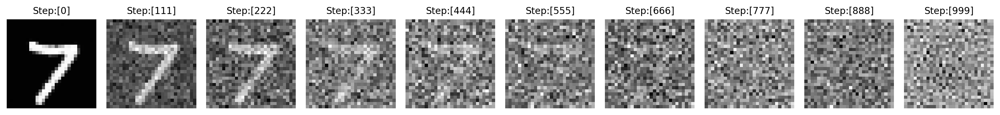

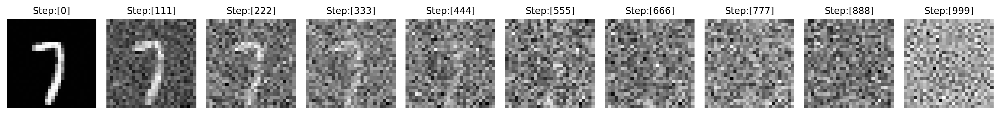

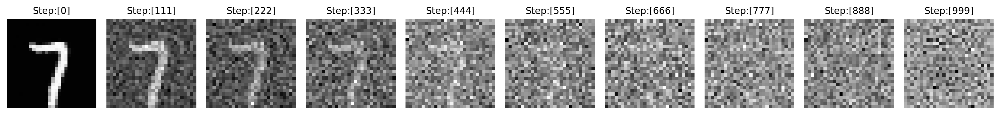

In [ ]:
def get_conditioning_embedding_circle_number(circle, number, device):
    circle_label = circle
    # 레이블을 텐서로 변환
    circle_label = torch.tensor(circle_label, dtype=torch.long).to(device)
    number_label = torch.tensor(number, dtype=torch.long).to(device)
    # 임베딩 벡터 생성
    circle_embed = circle_embedding(circle_label)
    number_embed = number_embedding(number_label)


    # 두 임베딩 벡터를 결합
    conditioning_embedding = torch.cat([circle_embed, number_embed], dim=-1)
    
    return conditioning_embedding

n_sample = 6
test_embedding_vector = get_conditioning_embedding_circle_number(0,9,device)
step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device,test_embedding_vector)
plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=n_sample)

100%|██████████| 10/10 [07:53<00:00, 47.38s/it]

Cosine Similarities:


,Similarity 0,Similarity 1,Similarity 2,Similarity 3,Similarity 4,Similarity 5,Similarity 6,Similarity 7,Similarity 8,Similarity 9
Digit 0,1.000000,0.984116,0.983981,0.978665,0.978157,0.980907,0.989070,0.973028,0.987849,0.982028
Digit 1,0.984138,0.999999,0.983032,0.978065,0.982642,0.979262,0.984500,0.979932,0.984417,0.982198
Digit 2,0.983862,0.982993,0.999999,0.993432,0.990600,0.990633,0.992750,0.988422,0.993735,0.990502
Digit 3,0.978706,0.978180,0.993428,0.999999,0.988914,0.992104,0.986167,0.990343,0.988740,0.990661
Digit 4,0.978081,0.982603,0.990619,0.988966,0.999999,0.987130,0.988816,0.989463,0.988359,0.992149
Digit 5,0.980837,0.979199,0.990668,0.992080,0.987114,1.000000,0.990123,0.980474,0.990069,0.987367
Digit 6,0.989062,0.984429,0.992811,0.986084,0.988860,0.990123,0.999999,0.979849,0.994650,0.990975
Digit 7,0.972888,0.979835,0.988242,0.990396,0.989343,0.980513,0.979903,0.999999,0.981810,0.992238
Digit 8,0.987776,0.984382,0.993809,0.988804,0.988420,0.990047,0.994600,0.981480,0.999999,0.989592
Digit 9,0.981953,0.982094,0.990424,0.990611,0.992135,0.987329,0.990984,0.992253,0.989588,0.999999


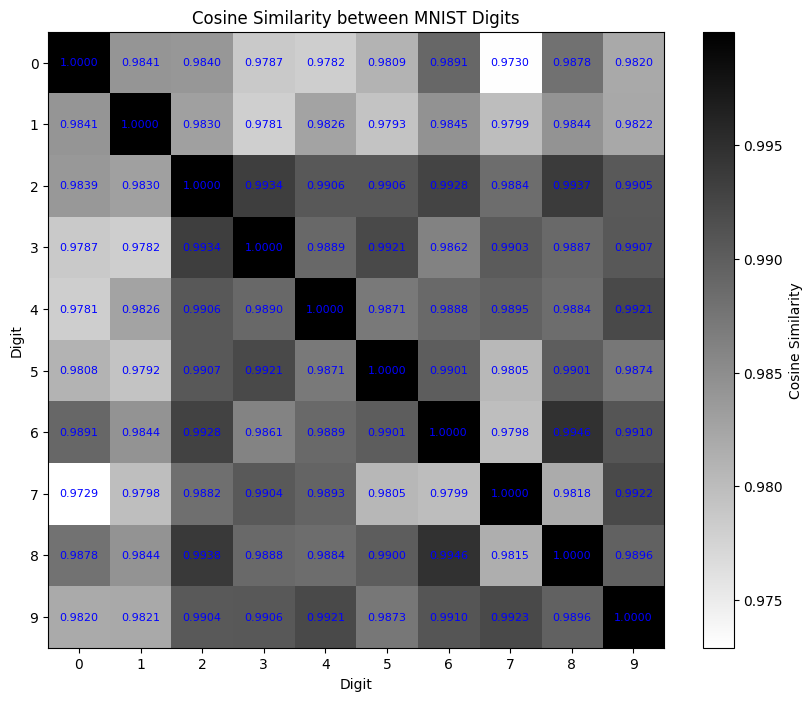

In [ ]:
import torch
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import clip
from PIL import Image
from tqdm import tqdm
import random

def mnist(root_path='../data/', batch_size=128):
    """ 
    MNIST
    """
    mnist_train = datasets.MNIST(root=root_path, train=True, transform=transforms.ToTensor(), download=True)
    mnist_test = datasets.MNIST(root=root_path, train=False, transform=transforms.ToTensor(), download=True)
    train_iter = torch.utils.data.DataLoader(mnist_train, batch_size=batch_size, shuffle=True, num_workers=1)
    test_iter = torch.utils.data.DataLoader(mnist_test, batch_size=batch_size, shuffle=True, num_workers=1)
    # Data
    train_data, train_label = mnist_train.data, mnist_train.targets
    test_data, test_label = mnist_test.data, mnist_test.targets
    return train_iter, test_iter, train_data, train_label, test_data, test_label

def tensor_to_pil(image_tensor):
    image_tensor = image_tensor.squeeze(0)  # Remove channel dimension
    image_pil = transforms.ToPILImage()(image_tensor)
    return image_pil

def calculate_clip_similarity(train_data, train_label, sample_size=1000):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load("ViT-B/32", device=device)

    similarities = np.zeros((10, 10))

    for i in tqdm(range(10)):
        indices_i = torch.where(train_label == i)[0].tolist()
        sampled_indices_i = random.sample(indices_i, min(sample_size, len(indices_i)))
        images_i = train_data[sampled_indices_i]
        images_i = [preprocess(tensor_to_pil(image)) for image in images_i]
        images_i = torch.stack(images_i).to(device)

        with torch.no_grad():
            features_i = model.encode_image(images_i).float()

        for j in range(10):
            indices_j = torch.where(train_label == j)[0].tolist()
            sampled_indices_j = random.sample(indices_j, min(sample_size, len(indices_j)))
            images_j = train_data[sampled_indices_j]
            images_j = [preprocess(tensor_to_pil(image)) for image in images_j]
            images_j = torch.stack(images_j).to(device)

            with torch.no_grad():
                features_j = model.encode_image(images_j).float()

            similarities[i, j] = torch.cosine_similarity(features_i.mean(dim=0), features_j.mean(dim=0), dim=0).mean().item()

    return similarities

def render_results(similarities):
    # Creating DataFrame for similarities
    df_similarities = pd.DataFrame(similarities, columns=[f'Similarity {i}' for i in range(10)], index=[f'Digit {i}' for i in range(10)])
    
    # Displaying the similarity table
    print("Cosine Similarities:")
    display(df_similarities)
    
    # Plotting the graph
    plt.figure(figsize=(10, 8))
    plt.imshow(similarities, cmap='gray_r', interpolation='none')  # Use 'gray_r' to make darker colors represent higher similarity
    plt.colorbar(label='Cosine Similarity')
    plt.title('Cosine Similarity between MNIST Digits')
    plt.xlabel('Digit')
    plt.ylabel('Digit')
    plt.xticks(ticks=np.arange(10), labels=np.arange(10))
    plt.yticks(ticks=np.arange(10), labels=np.arange(10))

    # Annotate each cell with the similarity value
    for i in range(10):
        for j in range(10):
            plt.text(j, i, f'{similarities[i, j]:.4f}', ha='center', va='center', color='blue', fontsize=8)

    plt.show()

train_iter, test_iter, train_data, train_label, test_data, test_label = mnist()
similarities = calculate_clip_similarity(train_data, train_label, 5000)
render_results(similarities)

In [ ]:
# import torch

# # 저장된 파일 경로
# load_path = 'path/to/save/diffusion_model.pth'

# # 모델과 옵티마이저를 초기화
# model = DiffusionUNetLegacy(
#     name                 = 'unet',
#     dims                 = 2,
#     n_in_channels        = 1,
#     n_base_channels      = 64,
#     n_emb_dim            = 128,
#     n_cond_dim           = embedding_dim,
#     n_enc_blocks         = 4,
#     n_dec_blocks         = 4,
#     n_groups             = 16,
#     n_heads              = 4,
#     actv                 = nn.SiLU(),
#     kernel_size          = 3,
#     padding              = 1,
#     use_attention        = False,
#     skip_connection      = True,
#     chnnel_multiples     = (1,2,4,8),
#     updown_rates         = (1,2,1,2),
#     use_scale_shift_norm = True,
#     device               = device,
# )

# optm = torch.optim.AdamW(params=model.parameters(), lr=1e-4, weight_decay=0.0)
# schd = torch.optim.lr_scheduler.ExponentialLR(optimizer=optm, gamma=0.99998)

# # 체크포인트 로드
# checkpoint = torch.load(load_path)

# # 모델과 옵티마이저 상태 복원
# model.load_state_dict(checkpoint['model_state_dict'])
# optm.load_state_dict(checkpoint['optimizer_state_dict'])
# schd.load_state_dict(checkpoint['scheduler_state_dict'])

# epoch = checkpoint['epoch']
# loss = checkpoint['loss']

# model.train()  # 모델을 학습 모드로 설정
# # model.eval()  # 평가 모드로 설정하려면 이 라인을 사용

# print(f'Model loaded from {load_path}, resumed from iteration {epoch}')